In [1]:
# I'm using runpod.io to do this work, and theseae
!pip install polars pillow matplotlib torch timm scikit-learn tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.5/31.5 MB 111.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 204.4 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 302.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 225.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 39.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 305.2/305.2 kB 120.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 194.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.8/301.8 kB 119.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━

In [2]:
import polars as pl
import matplotlib.pyplot as plt

import os
from pathlib import Path
from PIL import Image

from tqdm.notebook import tqdm

In [3]:
data_dir = Path("clothing-dataset")

In [4]:
os.listdir(data_dir)

['jean_jacket.jpeg',
 'blue_polo.jpeg',
 '.ipynb_checkpoints',
 'polo.jpeg',
 'images',
 'images.csv',
 'README.md',
 'LICENSE',
 '.git']

In [5]:
df = pl.read_csv(data_dir / "images.csv")

In [6]:
df.head()

image,sender_id,label,kids
str,i64,str,bool
"""4285fab0-751a-4b74-8e9b-43af05…",124,"""Not sure""",false
"""ea7b6656-3f84-4eb3-9099-23e623…",148,"""T-Shirt""",false
"""00627a3f-0477-401c-95eb-92642c…",94,"""Not sure""",false
"""ea2ffd4d-9b25-4ca8-9dc2-bd27f1…",43,"""T-Shirt""",false
"""3b86d877-2b9e-4c8b-a6a2-1d8751…",189,"""Shoes""",false


In [7]:
remove_imgs = (set(df["image"].to_list()) - set(list(map(lambda x: x.split(".")[0], os.listdir(data_dir / "images")))))

In [15]:
# remove images that appear in CSV but not the data directory
df = df.filter(~pl.col("image").is_in(remove_imgs) & 
               (pl.col("label") != "Skip") &
               (pl.col("label") != "Not sure"))

In [16]:
for row in df["label"].value_counts().iter_rows(named=True):
    print(row["label"], row["count"])

Longsleeve 699
Polo 120
Dress 357
Undershirt 118
Pants 692
Skirt 155
Shirt 378
T-Shirt 1011
Shorts 308
Blazer 109
Top 43
Shoes 431
Blouse 23
Hat 171
Hoodie 100
Other 67
Outwear 312
Body 69


In [17]:
image_files = os.listdir(data_dir / "images")

In [18]:
# sorted in lexiconical order
labels = sorted(df["label"].unique().to_list())

In [19]:
label2idx = {label:i for i,label in enumerate(labels)}
idx2label = {i:label for label,i in label2idx.items()}

In [20]:
label2idx

{'Blazer': 0,
 'Blouse': 1,
 'Body': 2,
 'Dress': 3,
 'Hat': 4,
 'Hoodie': 5,
 'Longsleeve': 6,
 'Other': 7,
 'Outwear': 8,
 'Pants': 9,
 'Polo': 10,
 'Shirt': 11,
 'Shoes': 12,
 'Shorts': 13,
 'Skirt': 14,
 'T-Shirt': 15,
 'Top': 16,
 'Undershirt': 17}

In [21]:
idx2label

{0: 'Blazer',
 1: 'Blouse',
 2: 'Body',
 3: 'Dress',
 4: 'Hat',
 5: 'Hoodie',
 6: 'Longsleeve',
 7: 'Other',
 8: 'Outwear',
 9: 'Pants',
 10: 'Polo',
 11: 'Shirt',
 12: 'Shoes',
 13: 'Shorts',
 14: 'Skirt',
 15: 'T-Shirt',
 16: 'Top',
 17: 'Undershirt'}

### Complete Garbage Model

In [22]:
import timm
import torch
import torch.nn.functional as F

In [23]:
baseline_model = timm.create_model("efficientnet_b3", num_classes=len(idx2label))

In [466]:
from typing import Any, Dict, List, Tuple

In [25]:
import torch
from torch import nn
from torch.optim import AdamW
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

from torchvision.transforms import v2

/usr/local/lib/python3.10/dist-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https:/

In [26]:
class ClothesDataset(Dataset):

    def __init__(self, df: pl.DataFrame, data_dir: Path, label2idx: Dict[int, str]):
        self.df = df
        self.data_dir = data_dir
        self.label2idx = label2idx

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image, label = self.df[idx]["image"].item(), self.df[idx]["label"].item()
        image = Image.open(self.data_dir / "images" / f"{image}.jpg")

        transforms = v2.Compose([
            #v2.ToImage(),
            #v2.ToDtype(torch.float32, scale=True),
            v2.ToTensor(),
            v2.Resize((224,224)),
            v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

        image = transforms(image)
        label = torch.tensor(int(self.label2idx[label])).long()

        return image.float(), label

In [27]:
from sklearn.model_selection import train_test_split

In [28]:
X_train, X_test_val, y_train, y_test_val = \
train_test_split(df, df["label"], test_size=0.2, stratify=df["label"], random_state=420)

In [29]:
X_val, X_test, y_val, y_test = \
train_test_split(X_test_val, X_test_val["label"], stratify=y_test_val, test_size=0.5, random_state=42)

<BarContainer object of 18 artists>

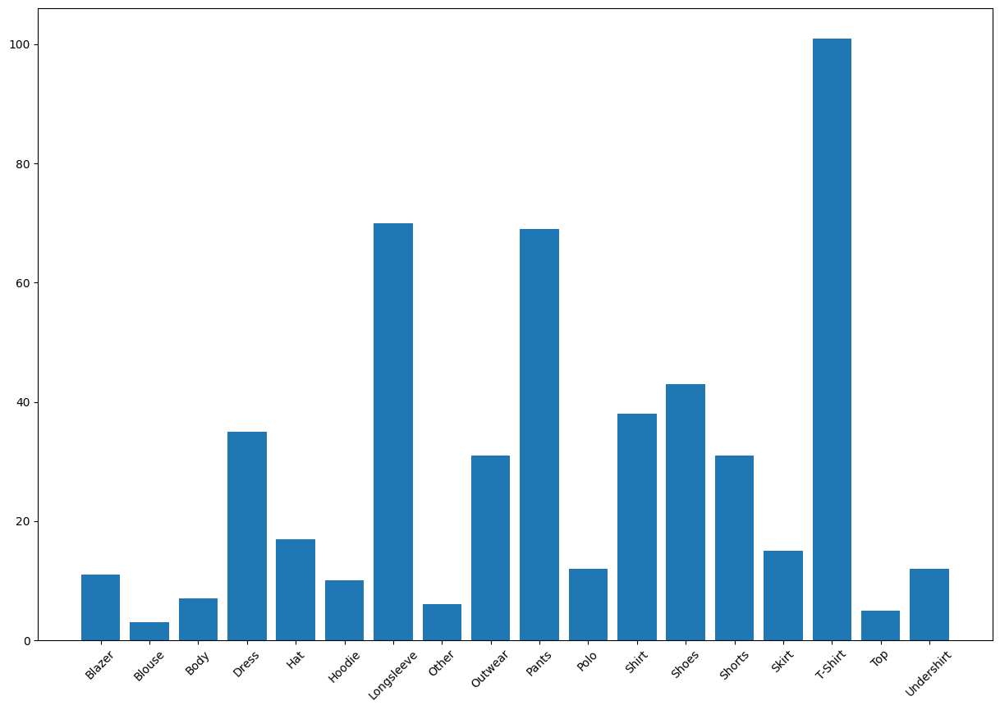

In [30]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
plt.bar(X_val["label"].value_counts().sort(by="label")["label"], 
        X_val["label"].value_counts().sort(by="label")["count"])

In [31]:
X_train.shape, X_val.shape, X_test.shape

((4130, 4), (516, 4), (517, 4))

<BarContainer object of 18 artists>

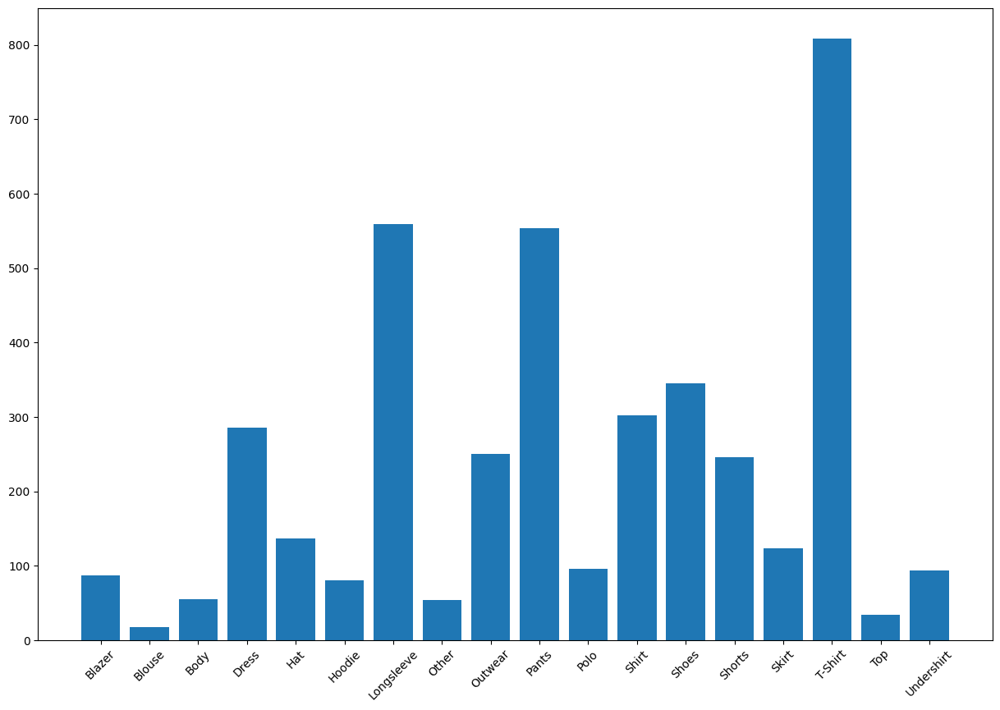

In [32]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
plt.bar(X_train["label"].value_counts().sort(by="label")["label"], 
        X_train["label"].value_counts().sort(by="label")["count"])

<BarContainer object of 18 artists>

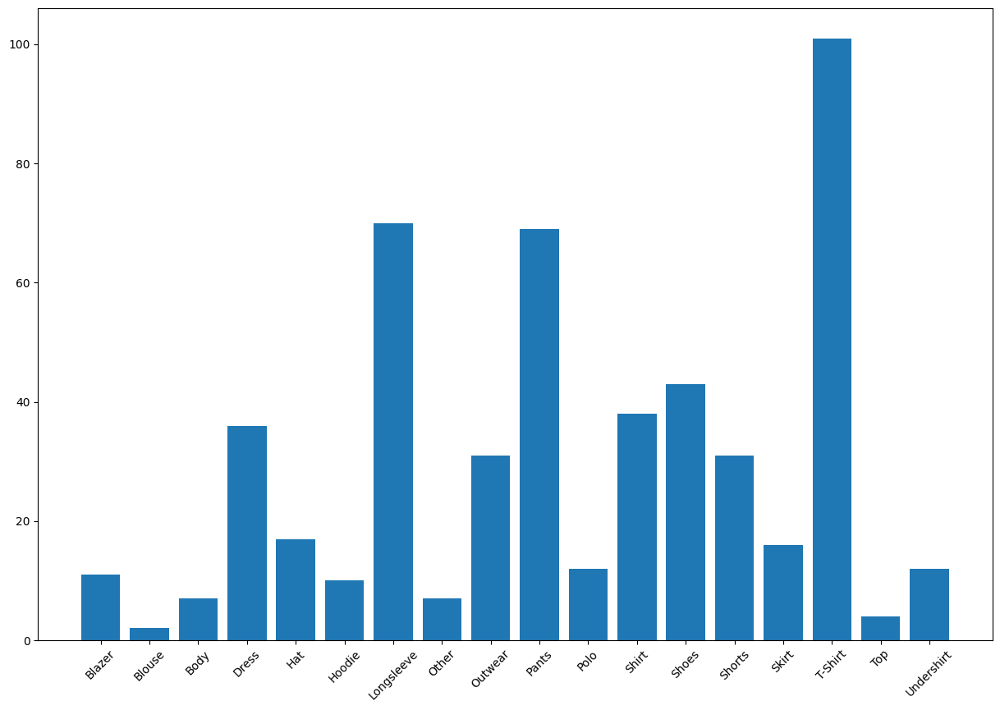

In [33]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
plt.bar(X_test["label"].value_counts().sort(by="label")["label"], 
        X_test["label"].value_counts().sort(by="label")["count"])

In [34]:
ds_train = ClothesDataset(X_train, data_dir, label2idx)
ds_val = ClothesDataset(X_val, data_dir, label2idx)
ds_test = ClothesDataset(X_test, data_dir, label2idx)

In [35]:
next(iter(ds_train))

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:41: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `transforms.Compose([transforms.ToImageTensor(), transforms.ConvertImageDtype()])`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
 

(tensor([[[-0.4408, -0.3917, -0.3216,  ..., -0.1314, -0.1736, -0.1412],
          [-0.3906, -0.3575, -0.3206,  ..., -0.1145, -0.1630, -0.1280],
          [-0.3785, -0.3510, -0.3088,  ..., -0.0968, -0.1274, -0.1054],
          ...,
          [ 1.3132,  1.3755,  1.3376,  ...,  0.1738,  0.0838, -0.0552],
          [ 1.3376,  1.3778,  1.3089,  ..., -0.0999, -0.2260, -0.3764],
          [ 1.3798,  1.3694,  1.1342,  ..., -0.4496, -0.5962, -0.7390]],
 
         [[-1.7393, -1.6891, -1.6512,  ..., -1.6318, -1.6412, -1.6080],
          [-1.6879, -1.6541, -1.6502,  ..., -1.6145, -1.6303, -1.5946],
          [-1.6755, -1.6474, -1.6381,  ..., -1.5976, -1.6289, -1.5810],
          ...,
          [-0.9265, -0.8215, -0.7978,  ..., -1.4507, -1.4684, -1.5788],
          [-0.9015, -0.8191, -0.8271,  ..., -1.5594, -1.6140, -1.7265],
          [-0.8409, -0.8277, -1.0134,  ..., -1.7042, -1.7106, -1.7889]],
 
         [[-1.2479, -1.1979, -1.1434,  ..., -1.0892, -1.1154, -1.0824],
          [-1.1968, -1.1631,

In [36]:
dl_train = DataLoader(ds_train, batch_size=8)
dl_val = DataLoader(ds_val, batch_size=8)
dl_test = DataLoader(ds_test, batch_size=8)

In [37]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [38]:
baseline_model.to(device)
print()

In [39]:
criterion = nn.CrossEntropyLoss()
optimizer = AdamW(baseline_model.parameters(), lr=3e-4)

In [40]:
# overfit over one batch to make sure the loss is going down
for epoch in range(10):
    for data, label in dl_train:
        optimizer.zero_grad()
        output = baseline_model(data.to(device))
        loss = criterion(output, label.to(device))
        loss.backward()
        optimizer.step()
        break
    print(loss.item())

4.814035892486572
1.910847783088684
0.5562463402748108
0.19468985497951508
0.14124125242233276
0.06996525079011917
0.035794489085674286
0.015755226835608482
0.008327369578182697
0.004022298380732536


Our loss is definitely overfitting which is good. We can now train a baseline model

### Main Training Loop

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = AdamW(baseline_model.parameters(), lr=3e-4)

In [ ]:
training_losses = []
val_losses = []

for epoch in range(10):
    baseline_model.train()
    for i, (data, label) in tqdm(enumerate(dl_train)):
        optimizer.zero_grad()
        output = baseline_model(data.to(device))
        loss = criterion(output, label.to(device))
        loss.backward()
        optimizer.step()

        if i % 1000:
            training_losses.append(loss.item())
            
    optimizer.zero_grad()
    baseline_model.eval()
    
    val_loss = 0.0
    for i, (data, label) in tqdm(enumerate(dl_val)):
        with torch.no_grad():
            output = baseline_model(data.to(device))
            loss = criterion(output, label.to(device))
        val_loss += loss.item()
    val_losses.append(val_loss / (i + 1))
    
    print(val_losses[-1])

In [ ]:
# training loss looks good
plt.title("Training Losses")
plt.plot(range(len(training_losses)), training_losses)

In [ ]:
# overfitting to hell
plt.title("Val Losses")
plt.plot(range(len(val_losses)), val_losses)

In [ ]:
torch.save(baseline_model.state_dict(), "baseline_classifier_efficientnetv3_v1.pt")

### Setup Ourselves Up for Faster Iteration

In [ ]:
def train(model, optimizer, epoches: int = 10, lr: float = 3e-4):

    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer(model.parameters(), lr=lr)

    training_losses = []
    val_losses = []
    
    for epoch in range(epoches):
        model.train()
        for i, (data, label) in tqdm(enumerate(dl_train)):
            optimizer.zero_grad()
            output = model(data.to(device))
            loss = criterion(output, label.to(device))
            loss.backward()
            optimizer.step()
    
            if i % 1000:
                training_losses.append(loss.item())
                
        optimizer.zero_grad()
        model.eval()
        
        val_loss = 0.0
        for i, (data, label) in tqdm(enumerate(dl_val)):
            with torch.no_grad():
                output = model(data.to(device))
                loss = criterion(output, label.to(device))
            val_loss += loss.item()
        val_losses.append(val_loss / (i + 1))
        
        print(val_losses[-1])

    return model, training_losses, val_losses

In [ ]:
# add dropout to regularize the model
model = timm.create_model("efficientnet_b3", num_classes=19, drop_rate=0.2, drop_path_rate=0.2)
model.to(device)
print()

In [ ]:
trained_model, train_losses, val_losses = train(model, AdamW)

In [ ]:
# training loss looks good
plt.title("Training Losses")
plt.plot(range(len(train_losses)), train_losses)

In [ ]:
# seems to start overfiting at the end.
plt.title("Val Losses")
plt.plot(range(len(val_losses)), val_losses)

In [ ]:
model = timm.create_model("efficientnet_b3", num_classes=19, drop_rate=0.2, drop_path_rate=0.2)
model.to(device)
print()

In [ ]:
# amp up the number of epoches to see if that overfitting in validation can still go down
trained_model, train_losses, val_losses = train(model, AdamW, 25)

In [ ]:
# training loss looks good
plt.title("Training Losses")
plt.plot(range(len(train_losses)), train_losses)

In [ ]:
# seems to start overfiting at the end.
plt.title("Val Losses")
plt.plot(range(len(val_losses)), val_losses)

In [ ]:
torch.save(model.state_dict(), "baseline_classifier_efficientnetv3_v2.pt")

### Check Validation Accuracy, Not Just Loss

In [ ]:
baseline_model.load_state_dict(torch.load("baseline_classifier_efficientnetv3_v2.pt"))

In [ ]:
model = baseline_model

In [ ]:
model.to(device)
print()

In [ ]:
transforms = v2.Compose([
            v2.ToTensor(),
            v2.Resize((224,224)),
            v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

In [ ]:
val_labels = []
probs_list = []

with torch.no_grad():
    for img_path in tqdm(X_val["image"].to_list()):
        img = plt.imread(f"clothing-dataset/images/{img_path}.jpg")
        img = transforms(img)
        probs = F.softmax(model(img[None, ...].to(device)))
        probs_list.append(probs)
        
        idx = probs.argmax().item()
        val_labels.append(idx2label[idx])

In [ ]:
X_val_check = X_val.clone()

In [ ]:
X_val_check = X_val_check.with_columns(predicted=pl.Series(val_labels))

In [ ]:
X_val_check

In [ ]:
X_val_check = X_val_check.with_columns(accurate=pl.col("label") == pl.col("predicted"))

In [ ]:
X_val_check["accurate"].sum() / X_val_check.shape[0]

In [ ]:
# around 23.56% accuracy. This is better than just guessing, because a just guessing classifier would
# be at only ~5% (because random classifier would be right 1 out 19 (num class labels) times)

### Error Analysis

In [ ]:
error_df = X_val_check[["accurate", "label"]].pivot(index="label",
                                                    columns="accurate",
                                                    values="accurate",
                                                    aggregate_function="count").fill_null(0)

In [ ]:
error_df = error_df.with_columns(total=pl.col("true") + pl.col("false"))
error_df = error_df.with_columns(accuracy=pl.col("true") / pl.col("total"))

In [ ]:
error_df.sort(by="accuracy", descending=True)

In [ ]:

# sooooo our model is only predicting T-shirt or Longsleeve....that's not good
X_val_check["predicted"].value_counts()

In [ ]:
## let's regraph the train data distribution

In [ ]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
plt.bar(X_train["label"].value_counts().sort(by="label")["label"], 
        X_train["label"].value_counts().sort(by="label")["count"])

It makes sense that the two majority classes are T-shirt and Long Sleeve and those are the only two labels we're getting outputs for. However, how do we stop this? We could try balancing it with weights.

In [ ]:
class_weights = \
1 - ((X_train["label"].value_counts().sort(by="label")["count"] / X_train["label"].value_counts().sort(by="label")["count"].sum()))

In [ ]:
class_weights = torch.tensor(class_weights)
torch.tensor(class_weights)

This is a simply doing 1 - percent of samples in dataset. Found it from this link: https://naadispeaks.blog/2021/07/31/handling-imbalanced-classes-with-weighted-loss-in-pytorch/

Seems fairly intutive. I've seen people also do inverse of this with 1/(x**-0.5) but let's keep it simple for now to retrain. Let's also add some label smoothing to make our model less confident after we see what weighing does.

### Weighed Training

In [500]:
def train(model, optimizer, epoches: int = 10, lr: float = 3e-4, weights: torch.tensor = None):

    if weights is not None:
        criterion = nn.CrossEntropyLoss(weight=weights)
    else:
        criterion = nn.CrossEntropyLoss()
        
    optimizer = optimizer(model.parameters(), lr=lr)

    training_losses = []
    val_losses = []
    
    for epoch in range(epoches):
        model.train()
        for i, (data, label) in tqdm(enumerate(dl_train)):
            optimizer.zero_grad()
            output = model(data.to(device))
            loss = criterion(output, label.to(device))
            loss.backward()
            optimizer.step()
    
            if i % 1000:
                training_losses.append(loss.item())
                
        optimizer.zero_grad()
        model.eval()
        
        val_loss = 0.0
        for i, (data, label) in tqdm(enumerate(dl_val)):
            with torch.no_grad():
                output = model(data.to(device))
                loss = criterion(output, label.to(device))
            val_loss += loss.item()
        val_losses.append(val_loss / (i + 1))
        
        print(val_losses[-1])

    return model, training_losses, val_losses

In [ ]:
model = timm.create_model("efficientnet_b3", num_classes=19, drop_rate=0.2, drop_path_rate=0.2)
model.to(device)
print()

In [ ]:
trained_model, train_losses, val_losses = train(model, AdamW, 25, weights=class_weights.to(device))

In [ ]:
plt.title("Training Losses")
plt.plot(range(len(train_losses)), train_losses)

In [ ]:
# overfitting to hell again
plt.title("Val Losses")
plt.plot(range(len(val_losses)), val_losses)

### Increase Dropout Rate

In [ ]:
model = timm.create_model("efficientnet_b3", num_classes=19, drop_rate=0.5, drop_path_rate=0.5)
model.to(device)
print()

In [ ]:
trained_model, train_losses, val_losses = train(model, AdamW, 15)

In [ ]:
plt.title("Training Losses")
plt.plot(range(len(train_losses)), train_losses)

In [ ]:
# overfitting to hell again
plt.title("Val Losses")
plt.plot(range(len(val_losses)), val_losses)

In [ ]:
torch.save(trained_model.state_dict(), "baseline_classifier_efficientnetv3_v3.pt")

### Do More Epoches

In [ ]:
model = timm.create_model("efficientnet_b3", num_classes=19, drop_rate=0.5, drop_path_rate=0.5)
model.to(device)
print()

In [ ]:
trained_model, train_losses, val_losses = train(model, AdamW, 25, weights=class_weights.to(device))

In [ ]:
plt.title("Training Losses")
plt.plot(range(len(train_losses)), train_losses)

In [ ]:
# overfitting to hell....again. Maybe let's try data augmentation?
plt.title("Val Losses")
plt.plot(range(len(val_losses)), val_losses)

### Data Augmentations

In [31]:
class ClothesDatasetv2(Dataset):

    def __init__(self, df: pl.DataFrame, data_dir: Path, label2idx: Dict[int, str]):
        self.df = df
        self.data_dir = data_dir
        self.label2idx = label2idx

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image, label = self.df[idx]["image"].item(), self.df[idx]["label"].item()
        image = Image.open(self.data_dir / "images" / f"{image}.jpg")

        transforms = v2.Compose([
            #v2.ToImage(),
            #v2.ToDtype(torch.float32, scale=True),
            v2.ToTensor(),
            v2.RandomHorizontalFlip(0.3),
            v2.RandomVerticalFlip(0.3),
            v2.Resize((224,224)),
            v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

        image = transforms(image)
        label = torch.tensor(int(self.label2idx[label])).long()

        return image.float(), label

In [32]:
ds_train = ClothesDataset(X_train, data_dir, label2idx)
ds_val = ClothesDataset(X_val, data_dir, label2idx)
ds_test = ClothesDataset(X_test, data_dir, label2idx)

In [33]:
dl_train = DataLoader(ds_train, batch_size=8)
dl_val = DataLoader(ds_val, batch_size=8)
dl_test = DataLoader(ds_test, batch_size=8)

In [34]:
def train(model, optimizer, epoches: int = 10, lr: float = 3e-4, weights: torch.tensor = None):

    if weights is not None:
        criterion = nn.CrossEntropyLoss(weight=weights)
    else:
        criterion = nn.CrossEntropyLoss()
        
    optimizer = optimizer(model.parameters(), lr=lr)

    training_losses = []
    val_losses = []
    
    for epoch in range(epoches):
        model.train()
        for i, (data, label) in tqdm(enumerate(dl_train)):
            optimizer.zero_grad()
            output = model(data.to(device))
            loss = criterion(output, label.to(device))
            loss.backward()
            optimizer.step()
    
            if i % 1000:
                training_losses.append(loss.item())
                
        optimizer.zero_grad()
        model.eval()
        
        val_loss = 0.0
        for i, (data, label) in tqdm(enumerate(dl_val)):
            with torch.no_grad():
                output = model(data.to(device))
                loss = criterion(output, label.to(device))
            val_loss += loss.item()
        val_losses.append(val_loss / (i + 1))
        
        print(val_losses[-1])

    return model, training_losses, val_losses

In [35]:
model = timm.create_model("efficientnet_b3", num_classes=19, drop_rate=0.5, drop_path_rate=0.5)
model.to(device)
print()

In [ ]:
trained_model, train_losses, val_losses = train(model, AdamW, 20, weights=class_weights.to(device))

In [ ]:
plt.title("Training Losses")
plt.plot(range(len(train_losses)), train_losses)

In [ ]:
# Augmentations seems to have some better results, but that loss curve is creaping up. Let's look at errors now.
plt.title("Val Losses")
plt.plot(range(len(val_losses)), val_losses)

### Error Analysis

In [36]:
model.load_state_dict(torch.load("baseline_classifier_efficientnetv3_v4_best.pt"))

<All keys matched successfully>

In [37]:
transforms = v2.Compose([
            v2.ToTensor(),
            v2.Resize((224,224)),
            v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

In [39]:
val_labels = []
probs_list = []

model.eval()
with torch.no_grad():
    for img_path in tqdm(X_val["image"].to_list()):
        img = plt.imread(f"clothing-dataset/images/{img_path}.jpg")
        img = transforms(img)
        probs = F.softmax(model(img[None, ...].to(device)))
        probs_list.append(probs)
        
        idx = probs.argmax().item()
        val_labels.append(idx2label[idx])

  0%|          | 0/539 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:152: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/tmp/ipykernel_3731/3175147792.py:9: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(model(img[None, ...].to(device)))


In [40]:
X_val_check = X_val.clone()

In [41]:

X_val_check = X_val_check.with_columns(predicted=pl.Series(val_labels))
X_val_check = X_val_check.with_columns(accurate=pl.col("label") == pl.col("predicted"))
X_val_check["accurate"].sum() / X_val_check.shape[0]
error_df = X_val_check[["accurate", "label"]].pivot(index="label",
                                                    columns="accurate",
                                                    values="accurate",
                                                    aggregate_function="count").fill_null(0)
error_df = error_df.with_columns(total=pl.col("true") + pl.col("false"))
error_df = error_df.with_columns(accuracy=pl.col("true") / pl.col("total"))
error_df.sort(by="accuracy", descending=True)

/tmp/ipykernel_3731/1451958411.py:4: DeprecationWarning: The argument `columns` for `DataFrame.pivot` is deprecated. It has been renamed to `on`.
  error_df = X_val_check[["accurate", "label"]].pivot(index="label",
/tmp/ipykernel_3731/1451958411.py:4: DeprecationWarning: `aggregate_function='count'` input for `pivot` is deprecated. Please use `aggregate_function='len'`.
  error_df = X_val_check[["accurate", "label"]].pivot(index="label",


label,true,false,total,accuracy
str,u32,u32,u32,f64
"""Pants""",58,11,69,0.84058
"""Shoes""",33,10,43,0.767442
"""T-Shirt""",76,25,101,0.752475
"""Shirt""",28,10,38,0.736842
"""Shorts""",19,12,31,0.612903
…,…,…,…,…
"""Hat""",3,14,17,0.176471
"""Undershirt""",2,10,12,0.166667
"""Other""",1,5,6,0.166667


In [42]:
# Wow. Much better than before! Each class has some accuracy and below we see that there is more representation
X_val_check["predicted"].value_counts()

predicted,count
str,u32
"""Shorts""",32
"""Pants""",65
"""Dress""",28
"""Shoes""",53
"""Other""",2
…,…
"""Not sure""",7
"""Polo""",7
"""Hoodie""",21


Text(0.5, 1.0, 'Percent Correct')

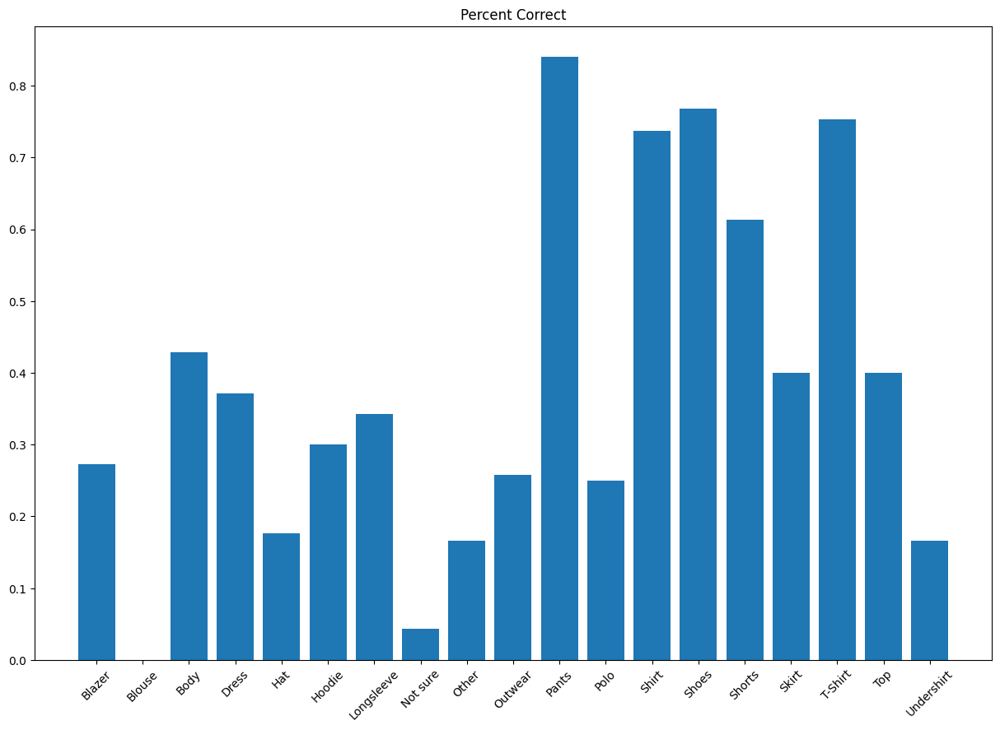

In [63]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
plt.bar(error_df.sort(by="label", descending=False)["label"], 
        error_df.sort(by="label", descending=False)["accuracy"])
plt.title("Percent Correct")

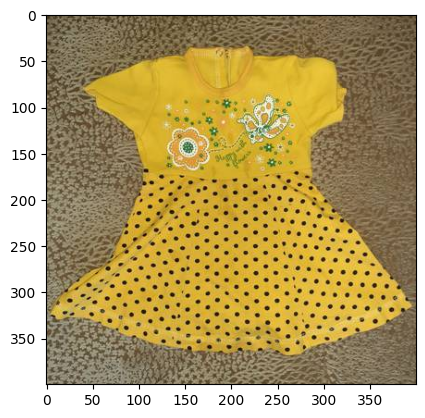

In [62]:
plt.imshow(plt.imread(data_dir / "images" / f'{X_val_check[-3]["image"].item()}.jpg'))

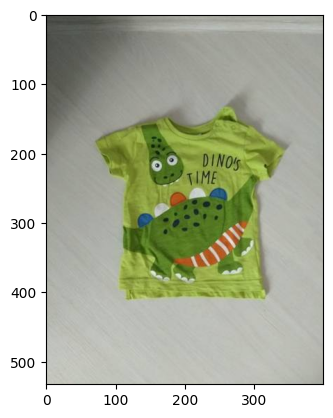

In [65]:
plt.imshow(plt.imread(data_dir / "images" / f'{X_val_check[-2]["image"].item()}.jpg'))

In [91]:
X_val_check

image,sender_id,label,kids,predicted,accurate
str,i64,str,bool,str,bool
"""9a75f3e5-4530-4df2-8527-9d3b39…",260,"""T-Shirt""",false,"""T-Shirt""",true
"""b0fd4976-e666-4d48-bb49-193f6c…",354,"""Longsleeve""",false,"""Longsleeve""",true
"""ec56de98-44c1-45e1-9de4-010c69…",352,"""Body""",true,"""Body""",true
"""19931b17-d23d-4b7a-91f8-ca5cbe…",361,"""Pants""",false,"""Pants""",true
"""4cc4e673-fecd-4e4e-a7eb-f2efd3…",181,"""Pants""",false,"""Pants""",true
…,…,…,…,…,…
"""d898c146-ef98-42ef-ad34-062d0a…",204,"""Longsleeve""",false,"""Longsleeve""",true
"""1604e827-c957-4677-a63f-180f32…",181,"""Longsleeve""",false,"""Shirt""",false
"""3f144818-2c26-4038-b48c-763981…",252,"""Dress""",true,"""Hat""",false


### Doing More Augmentations and Making our Dataset class Better

After going through some images manually with our error analysis, it seems like the angle at which the photos are taken or the background colors and items are causing issues. There are some common issue like shirt and long sleeves being mistaken for the other (which might be more of a label problem than a model problem. This is where definitions for things really matter). 

Anywho, we might get added benefits from adding random rotations, color changes, and other data augmentations. Let's first make our dataset class more flexible where we can add transforms as an arg not not hard code.

In [507]:
class ClothesDatasetv2(Dataset):

    def __init__(self, 
                 df: pl.DataFrame, 
                 data_dir: Path, 
                 label2idx: Dict[int, str],
                 transforms: List,
                 img_size: Tuple[int, int]=(224,224),
                 type="train"):
        
        self.df = df
        self.data_dir = data_dir
        self.label2idx = label2idx
        self.transforms = transforms
        self.img_size = img_size
        self.type = type

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image, label = self.df[idx]["image"].item(), self.df[idx]["label"].item()
        image = Image.open(self.data_dir / "images" / f"{image}.jpg")

        if self.type == "train":
            image = self.transforms(image)
        else:
            transforms = v2.Compose([
                #v2.ToImage(),
                #v2.ToDtype(torch.float32, scale=True),
                v2.ToTensor(),
                v2.Resize(self.img_size),
                v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])
            image = transforms(image)

        label = torch.tensor(int(self.label2idx[label])).long()

        return image.float(), label

In [481]:
transforms = v2.Compose([
            #v2.ToImage(),
            #v2.ToDtype(torch.float32, scale=True),
            v2.ToTensor(),
            v2.RandomPerspective(),
            v2.RandomRotation(degrees=(-90, 90)),
            v2.RandomHorizontalFlip(0.3),
            v2.RandomVerticalFlip(0.3),
            v2.Resize((224,224)),
            v2.RandomResizedCrop((224,224), scale=(0.6, 1.0)),
            v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

In [508]:
def create_datasets(X_train, X_val, X_test, transforms, img_size=(224,224)):
    ds_train = ClothesDatasetv2(X_train, data_dir, label2idx, transforms)
    ds_val = ClothesDatasetv2(X_val, data_dir, label2idx, transforms, type="validation")
    ds_test = ClothesDatasetv2(X_test, data_dir, label2idx, transforms, type="test")

    dl_train = DataLoader(ds_train, batch_size=8)
    dl_val = DataLoader(ds_val, batch_size=8)
    dl_test = DataLoader(ds_test, batch_size=8)

    return dl_train, dl_val, dl_test

In [509]:
dl_train, dl_val, dl_test = create_datasets(X_train, X_val, X_test, transforms)

In [510]:
model = timm.create_model("efficientnet_b3", num_classes=len(label2idx), drop_rate=0.5, drop_path_rate=0.5)
model.to(device)
print()

In [511]:
class_weights = \
1 - ((X_train["label"].value_counts().sort(by="label")["count"] / X_train["label"].value_counts().sort(by="label")["count"].sum()))

In [512]:
class_weights = torch.tensor(class_weights)
torch.tensor(class_weights)

/tmp/ipykernel_236/1249841798.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torch.tensor(class_weights)


tensor([0.9789, 0.9956, 0.9867, 0.9308, 0.9668, 0.9806, 0.8646, 0.9869, 0.9395,
        0.8659, 0.9768, 0.9269, 0.9165, 0.9404, 0.9700, 0.8041, 0.9918, 0.9772])

In [513]:
def train(model,
          dl_train,
          dl_val,
          optimizer,
          epoches: int = 10,
          lr: float = 3e-4,
          weights: torch.tensor = None):

    if weights is not None:
        criterion = nn.CrossEntropyLoss(weight=weights)
    else:
        criterion = nn.CrossEntropyLoss()
        
    optimizer = optimizer(model.parameters(), lr=lr)

    training_losses = []
    val_losses = []
    
    for epoch in range(epoches):
        model.train()
        for i, (data, label) in tqdm(enumerate(dl_train)):
            optimizer.zero_grad()
            output = model(data.to(device))
            loss = criterion(output, label.to(device))
            loss.backward()
            optimizer.step()
            training_losses.append(loss.item())
                
        optimizer.zero_grad()
        model.eval()
        
        val_loss = 0.0
        for i, (data, label) in tqdm(enumerate(dl_val)):
            with torch.no_grad():
                output = model(data.to(device))
                loss = criterion(output, label.to(device))
            val_loss += loss.item()
        val_losses.append(val_loss / (i + 1))
        
        print(val_losses[-1])

    return model, training_losses, val_losses

In [514]:
# much slower because of the transforms
trained_model, train_losses, val_losses = train(model, 
                                                dl_train, 
                                                dl_val, 
                                                AdamW, 
                                                25, 
                                                weights=class_weights.to(device))

0it [00:00, ?it/s]

0it [00:00, ?it/s]

8.885577110143808


0it [00:00, ?it/s]

0it [00:00, ?it/s]

5.719185161590576


0it [00:00, ?it/s]

0it [00:00, ?it/s]

3.371974123441256


0it [00:00, ?it/s]

0it [00:00, ?it/s]

3.0466480878683235


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.9501437223874607


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.7343252237026507


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.665255935375507


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.5655427070764394


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.561056324151846


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.5313964623671312


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.5542443642249473


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.531098829782926


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.5341327593876763


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.515869481746967


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.513045226610624


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.598642352911142


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.503902769088745


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.534357896217933


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.462054524054894


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.461608552932739


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.437122264275184


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.430752209516672


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.3357292101933407


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.393596469438993


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.275545971210186


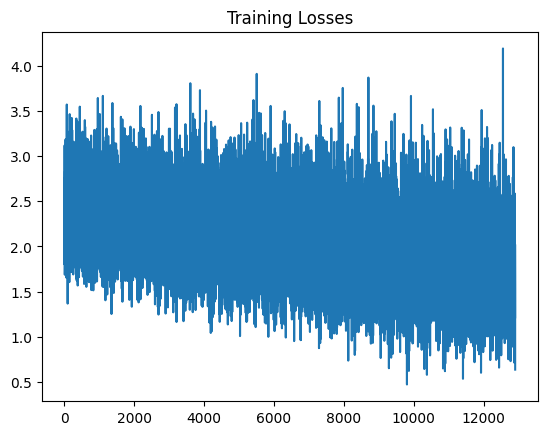

In [522]:
plt.title("Training Losses")
plt.plot(range(len(train_losses)), train_losses)

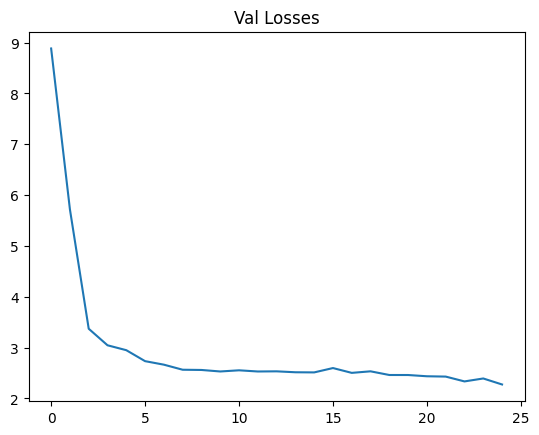

In [518]:
# smooth  but much slower
plt.title("Val Losses")
plt.plot(range(len(val_losses)), val_losses)

In [519]:
# train longer
trained_model, train_losses, val_losses = train(trained_model, 
                                                dl_train, 
                                                dl_val, 
                                                AdamW, 
                                                25, 
                                                weights=class_weights.to(device))

0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.221382683974046


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.2101605378664457


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.1444120773902307


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.180908359014071


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.0842739692101113


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.062119546303382


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.056699065061716


0it [00:00, ?it/s]

0it [00:00, ?it/s]

2.0673004718927235


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.9699426797720103


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.9496665624471812


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.9093600199772762


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.9246876551554752


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.9014832184864925


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.8287869279201214


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.793916210761437


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.7855478305083055


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.7718568416742178


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.7354514378767747


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.7402290206689102


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.6460594901671777


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.683599658195789


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.6797611456650954


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.6348940647565402


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.6587679386138916


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.621353493287013


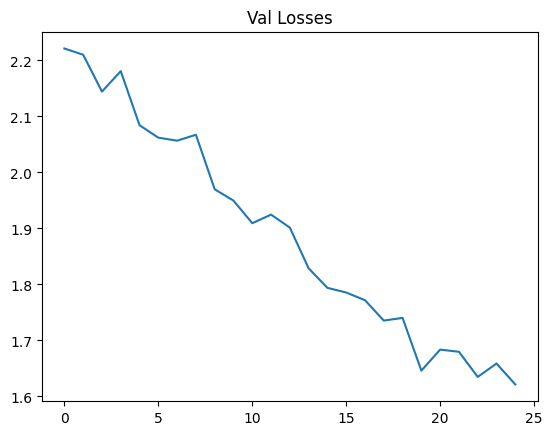

In [521]:
# not bad not bad
plt.title("Val Losses")
plt.plot(range(len(val_losses)), val_losses)

In [523]:
torch.save(trained_model.state_dict(), "baseline_classifier_efficientnetv3_v5_moreAug.pt")

  0%|          | 0/516 [00:00<?, ?it/s]

/tmp/ipykernel_236/3656362501.py:15: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(trained_model(img[None, ...].to(device)))
/tmp/ipykernel_236/3656362501.py:25: DeprecationWarning: The argument `columns` for `DataFrame.pivot` is deprecated. It has been renamed to `on`.
  error_df = X_val_check[["accurate", "label"]].pivot(index="label",
/tmp/ipykernel_236/3656362501.py:25: DeprecationWarning: `aggregate_function='count'` input for `pivot` is deprecated. Please use `aggregate_function='len'`.
  error_df = X_val_check[["accurate", "label"]].pivot(index="label",


Text(0.5, 1.0, 'Percent Correct')

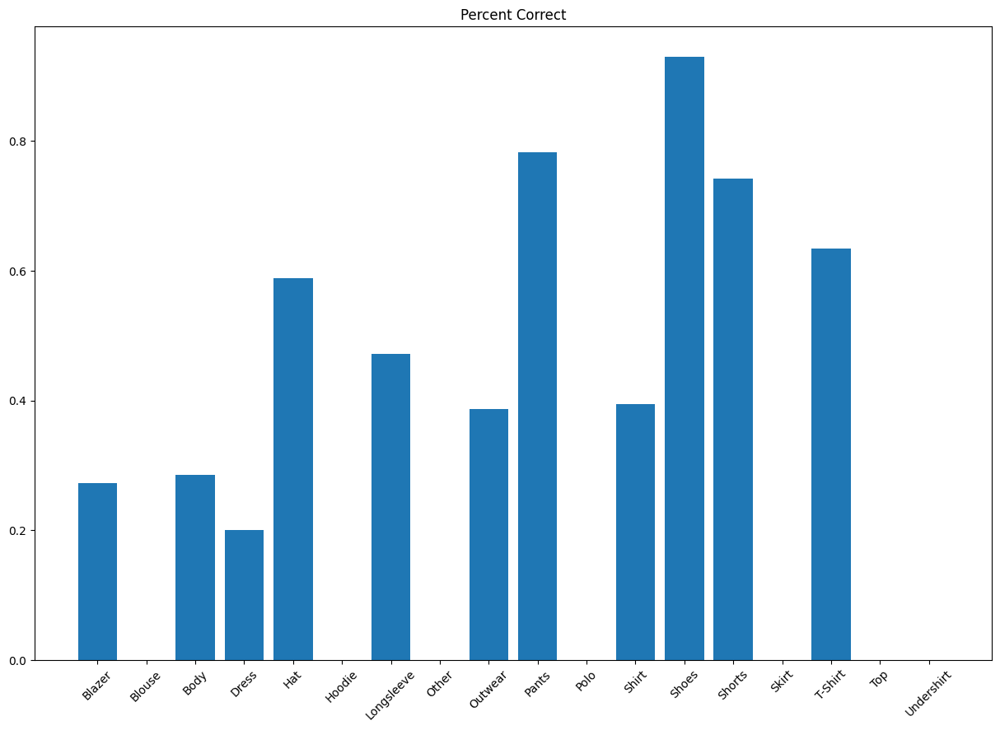

In [538]:
transforms = v2.Compose([
            v2.ToTensor(),
            v2.Resize((224,224)),
            v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

val_labels = []
probs_list = []

trained_model.eval()
with torch.no_grad():
    for img_path in tqdm(X_val["image"].to_list()):
        img = Image.open(f"clothing-dataset/images/{img_path}.jpg")
        img = transforms(img)
        probs = F.softmax(trained_model(img[None, ...].to(device)))
        probs_list.append(probs)
        
        idx = probs.argmax().item()
        val_labels.append(idx2label[idx])
        
X_val_check = X_val.clone()
X_val_check = X_val_check.with_columns(predicted=pl.Series(val_labels))
X_val_check = X_val_check.with_columns(accurate=pl.col("label") == pl.col("predicted"))
X_val_check["accurate"].sum() / X_val_check.shape[0]
error_df = X_val_check[["accurate", "label"]].pivot(index="label",
                                                    columns="accurate",
                                                    values="accurate",
                                                    aggregate_function="count").fill_null(0)
error_df = error_df.with_columns(total=pl.col("true") + pl.col("false"))
error_df = error_df.with_columns(accuracy=pl.col("true") / pl.col("total"))
error_df.sort(by="accuracy", descending=True)
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
plt.bar(error_df.sort(by="label", descending=False)["label"], 
        error_df.sort(by="label", descending=False)["accuracy"])
plt.title("Percent Correct")

In [539]:
error_df.sort(by="accuracy", descending=True)

label,false,true,total,accuracy
str,u32,u32,u32,f64
"""Shoes""",3,40,43,0.930233
"""Pants""",15,54,69,0.782609
"""Shorts""",8,23,31,0.741935
"""T-Shirt""",37,64,101,0.633663
"""Hat""",7,10,17,0.588235
…,…,…,…,…
"""Skirt""",15,0,15,0.0
"""Hoodie""",10,0,10,0.0
"""Blouse""",3,0,3,0.0


In [540]:
# shoes and hats looking better than before
error_df.sort(by="total", descending=True)

label,false,true,total,accuracy
str,u32,u32,u32,f64
"""T-Shirt""",37,64,101,0.633663
"""Longsleeve""",37,33,70,0.471429
"""Pants""",15,54,69,0.782609
"""Shoes""",3,40,43,0.930233
"""Shirt""",23,15,38,0.394737
…,…,…,…,…
"""Hoodie""",10,0,10,0.0
"""Body""",5,2,7,0.285714
"""Other""",6,0,6,0.0


In [541]:
# train even longer
trained_model, train_losses, val_losses = train(trained_model, 
                                                dl_train, 
                                                dl_val, 
                                                AdamW, 
                                                25, 
                                                weights=class_weights.to(device))

0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.5792808184256921


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.5277577977914076


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.5563797538097088


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.5561086911421556


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.5457403861559353


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.4513145437607398


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.53926060291437


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.4520611487902129


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.4608340153327355


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.479817859026102


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.4773907821912031


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.4674791767047002


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.4398914410517767


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.5235309179012593


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.523242537333415


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.475484986947133


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3513992896446816


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.365009775528541


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.362832641372314


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3575029909610747


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.4205621480941772


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3830159838383014


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.481467592716217


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.480515139034161


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3264922488194246


Newer Check

  0%|          | 0/516 [00:00<?, ?it/s]

/tmp/ipykernel_236/3656362501.py:15: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(trained_model(img[None, ...].to(device)))
/tmp/ipykernel_236/3656362501.py:25: DeprecationWarning: The argument `columns` for `DataFrame.pivot` is deprecated. It has been renamed to `on`.
  error_df = X_val_check[["accurate", "label"]].pivot(index="label",
/tmp/ipykernel_236/3656362501.py:25: DeprecationWarning: `aggregate_function='count'` input for `pivot` is deprecated. Please use `aggregate_function='len'`.
  error_df = X_val_check[["accurate", "label"]].pivot(index="label",


Text(0.5, 1.0, 'Percent Correct')

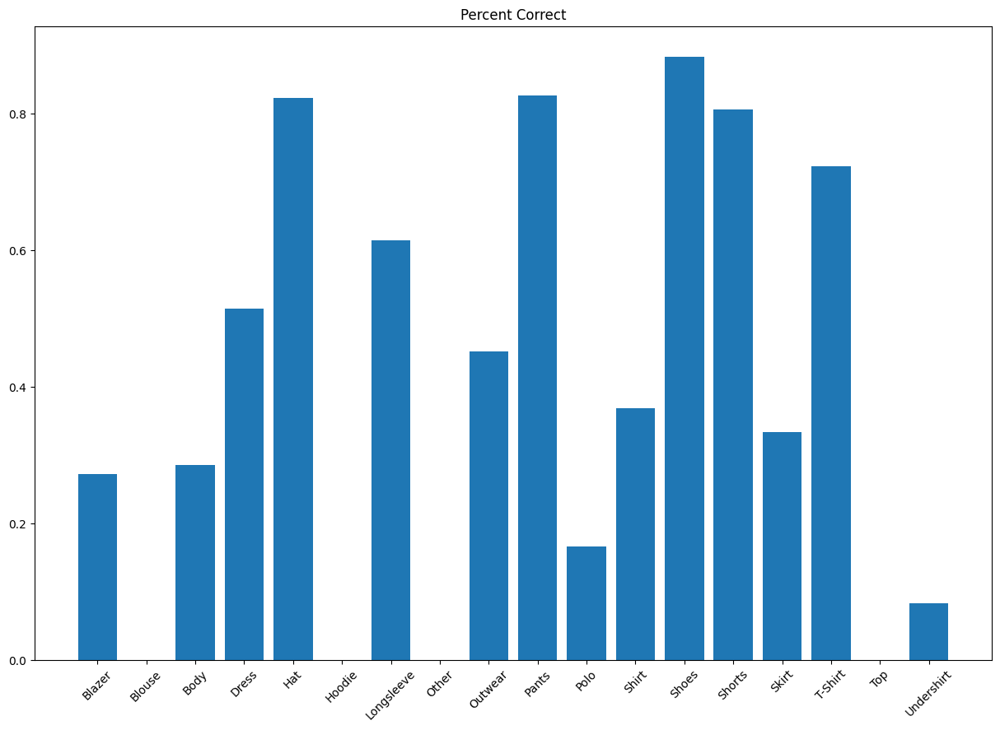

In [542]:
transforms = v2.Compose([
            v2.ToTensor(),
            v2.Resize((224,224)),
            v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

val_labels = []
probs_list = []

trained_model.eval()
with torch.no_grad():
    for img_path in tqdm(X_val["image"].to_list()):
        img = Image.open(f"clothing-dataset/images/{img_path}.jpg")
        img = transforms(img)
        probs = F.softmax(trained_model(img[None, ...].to(device)))
        probs_list.append(probs)
        
        idx = probs.argmax().item()
        val_labels.append(idx2label[idx])
        
X_val_check = X_val.clone()
X_val_check = X_val_check.with_columns(predicted=pl.Series(val_labels))
X_val_check = X_val_check.with_columns(accurate=pl.col("label") == pl.col("predicted"))
X_val_check["accurate"].sum() / X_val_check.shape[0]
error_df = X_val_check[["accurate", "label"]].pivot(index="label",
                                                    columns="accurate",
                                                    values="accurate",
                                                    aggregate_function="count").fill_null(0)
error_df = error_df.with_columns(total=pl.col("true") + pl.col("false"))
error_df = error_df.with_columns(accuracy=pl.col("true") / pl.col("total"))
error_df.sort(by="accuracy", descending=True)
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
plt.bar(error_df.sort(by="label", descending=False)["label"], 
        error_df.sort(by="label", descending=False)["accuracy"])
plt.title("Percent Correct")

In [543]:
# not looking bad at all. We're getting more parity with the
error_df.sort(by="accuracy", descending=True)

label,true,false,total,accuracy
str,u32,u32,u32,f64
"""Shoes""",38,5,43,0.883721
"""Pants""",57,12,69,0.826087
"""Hat""",14,3,17,0.823529
"""Shorts""",25,6,31,0.806452
"""T-Shirt""",73,28,101,0.722772
…,…,…,…,…
"""Undershirt""",1,11,12,0.083333
"""Other""",0,6,6,0.0
"""Hoodie""",0,10,10,0.0


In [544]:
torch.save(trained_model.state_dict(), "baseline_classifier_efficientnetv3_v6_moreAug.pt")

In [545]:
### MOOOOOORE!!!!!
trained_model, train_losses, val_losses = train(trained_model,
                                                dl_train,
                                                dl_val,
                                                AdamW, 
                                                25,
                                                weights=class_weights.to(device))

0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.4217448883331738


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3368332794079414


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3551285108694664


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3188881784677506


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3735998710760704


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3835427132936624


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3758897414574256


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3110398950485083


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.467372279900771


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.405154778636419


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.4714614652670346


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.272402656995333


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.296115521971996


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3651588631364016


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.2961485599096005


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.4851756302210002


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3719509273767472


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.346572634921624


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3934405063207334


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3046450719237328


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3818272799253464


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.367959848848673


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.385516589650741


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.3553574711084366


0it [00:00, ?it/s]

0it [00:00, ?it/s]

1.2805288101618106


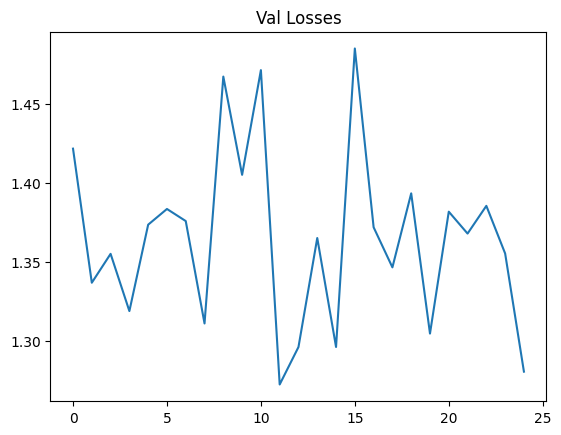

In [546]:
# not bad not bad
plt.title("Val Losses")
plt.plot(range(len(val_losses)), val_losses)

  0%|          | 0/516 [00:00<?, ?it/s]

/tmp/ipykernel_236/3656362501.py:15: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(trained_model(img[None, ...].to(device)))
/tmp/ipykernel_236/3656362501.py:25: DeprecationWarning: The argument `columns` for `DataFrame.pivot` is deprecated. It has been renamed to `on`.
  error_df = X_val_check[["accurate", "label"]].pivot(index="label",
/tmp/ipykernel_236/3656362501.py:25: DeprecationWarning: `aggregate_function='count'` input for `pivot` is deprecated. Please use `aggregate_function='len'`.
  error_df = X_val_check[["accurate", "label"]].pivot(index="label",


Text(0.5, 1.0, 'Percent Correct')

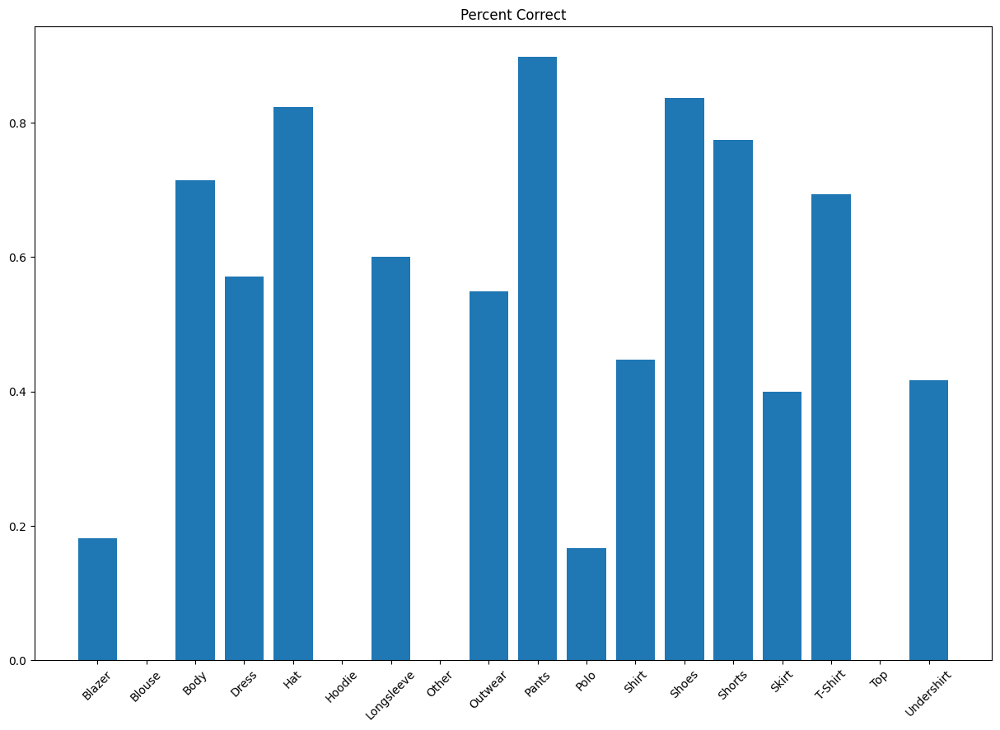

In [547]:
transforms = v2.Compose([
            v2.ToTensor(),
            v2.Resize((224,224)),
            v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

val_labels = []
probs_list = []

trained_model.eval()
with torch.no_grad():
    for img_path in tqdm(X_val["image"].to_list()):
        img = Image.open(f"clothing-dataset/images/{img_path}.jpg")
        img = transforms(img)
        probs = F.softmax(trained_model(img[None, ...].to(device)))
        probs_list.append(probs)
        
        idx = probs.argmax().item()
        val_labels.append(idx2label[idx])
        
X_val_check = X_val.clone()
X_val_check = X_val_check.with_columns(predicted=pl.Series(val_labels))
X_val_check = X_val_check.with_columns(accurate=pl.col("label") == pl.col("predicted"))
X_val_check["accurate"].sum() / X_val_check.shape[0]
error_df = X_val_check[["accurate", "label"]].pivot(index="label",
                                                    columns="accurate",
                                                    values="accurate",
                                                    aggregate_function="count").fill_null(0)
error_df = error_df.with_columns(total=pl.col("true") + pl.col("false"))
error_df = error_df.with_columns(accuracy=pl.col("true") / pl.col("total"))
error_df.sort(by="accuracy", descending=True)
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
plt.bar(error_df.sort(by="label", descending=False)["label"], 
        error_df.sort(by="label", descending=False)["accuracy"])
plt.title("Percent Correct")

In [548]:
error_df.sort(by="accuracy", descending=True)

label,true,false,total,accuracy
str,u32,u32,u32,f64
"""Pants""",62,7,69,0.898551
"""Shoes""",36,7,43,0.837209
"""Hat""",14,3,17,0.823529
"""Shorts""",24,7,31,0.774194
"""Body""",5,2,7,0.714286
…,…,…,…,…
"""Polo""",2,10,12,0.166667
"""Other""",0,6,6,0.0
"""Hoodie""",0,10,10,0.0


In [549]:
torch.save(trained_model.state_dict(), "baseline_classifier_efficientnetv3_v7_moreAug.pt")

In [555]:
trained_model.eval()
with torch.no_grad():
    img = Image.open(f"clothing-dataset/blue_polo.jpeg")
    img = transforms(img)
    probs = F.softmax(trained_model(img[None, ...].to(device)))
    print(probs)
    
    idx = probs.argmax().item()
    print(idx2label[idx])

tensor([[3.3419e-03, 4.6045e-05, 1.3213e-02, 6.1672e-03, 2.4405e-03, 1.0910e-01,
         3.9062e-01, 3.4047e-02, 3.5124e-02, 2.2556e-02, 9.6613e-04, 1.3864e-02,
         3.5546e-01, 4.8960e-03, 1.9910e-05, 1.2808e-03, 5.8809e-03, 9.7320e-04]],
       device='cuda:0')
Longsleeve


/tmp/ipykernel_236/1141317475.py:5: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(trained_model(img[None, ...].to(device)))


In [563]:
for i,prob in enumerate(probs[0, :]): print(idx2label[i], prob.item())

Blazer 0.003341927193105221
Blouse 4.6044740884099156e-05
Body 0.013213218189775944
Dress 0.006167217623442411
Hat 0.0024404763244092464
Hoodie 0.10910078138113022
Longsleeve 0.3906179368495941
Other 0.034047216176986694
Outwear 0.03512381389737129
Pants 0.022556258365511894
Polo 0.0009661324438638985
Shirt 0.013863599859178066
Shoes 0.35546451807022095
Shorts 0.004896027501672506
Skirt 1.9910305127268657e-05
T-Shirt 0.0012807653984054923
Top 0.0058808946050703526
Undershirt 0.0009731987956911325


In [564]:
trained_model.eval()
with torch.no_grad():
    img = Image.open(f"clothing-dataset/jean_jacket.jpeg")
    img = transforms(img)
    probs = F.softmax(trained_model(img[None, ...].to(device)))
    print(probs)
    
    idx = probs.argmax().item()
    print(idx2label[idx])

for i,prob in enumerate(probs[0, :]): print(idx2label[i], prob.item())

tensor([[9.9103e-02, 5.2308e-05, 9.9328e-04, 6.6635e-03, 8.6223e-03, 2.9004e-02,
         1.0820e-01, 4.8303e-02, 6.2038e-01, 4.0573e-04, 1.2525e-03, 4.4348e-02,
         2.6523e-02, 1.5521e-03, 8.5184e-05, 3.7224e-03, 6.4418e-04, 1.4903e-04]],
       device='cuda:0')
Outwear
Blazer 0.09910302609205246
Blouse 5.2308128942968324e-05
Body 0.0009932791581377387
Dress 0.006663506850600243
Hat 0.008622290566563606
Hoodie 0.029003702104091644
Longsleeve 0.10819757729768753
Other 0.04830311983823776
Outwear 0.6203793883323669
Pants 0.00040573449223302305
Polo 0.001252502202987671
Shirt 0.044347528368234634
Shoes 0.026523156091570854
Shorts 0.0015520750312134624
Skirt 8.518371032550931e-05
T-Shirt 0.003722398541867733
Top 0.0006441755103878677
Undershirt 0.00014902562543284148


/tmp/ipykernel_236/2622430239.py:5: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(trained_model(img[None, ...].to(device)))


In [565]:
trained_model.eval()
with torch.no_grad():
    img = Image.open(f"clothing-dataset/polo.jpeg")
    img = transforms(img)
    probs = F.softmax(trained_model(img[None, ...].to(device)))
    print(probs)
    
    idx = probs.argmax().item()
    print(idx2label[idx])

for i,prob in enumerate(probs[0, :]): print(idx2label[i], prob.item())

tensor([[8.8492e-03, 3.5678e-04, 1.8242e-03, 2.6262e-01, 6.5853e-04, 2.5489e-03,
         9.6363e-03, 2.4407e-02, 1.6725e-02, 5.1375e-01, 1.4112e-03, 1.8995e-03,
         3.8315e-05, 8.9524e-02, 2.1366e-02, 3.4290e-02, 9.4545e-04, 9.1526e-03]],
       device='cuda:0')
Pants
Blazer 0.008849217556416988
Blouse 0.00035678164567798376
Body 0.0018241741927340627
Dress 0.26262152194976807
Hat 0.0006585285882465541
Hoodie 0.0025488734245300293
Longsleeve 0.009636295028030872
Other 0.02440674975514412
Outwear 0.016725391149520874
Pants 0.5137452483177185
Polo 0.0014112157514318824
Shirt 0.0018995491554960608
Shoes 3.831519279628992e-05
Shorts 0.08952411264181137
Skirt 0.021366210654377937
T-Shirt 0.03428972139954567
Top 0.000945454346947372
Undershirt 0.009152648970484734


/tmp/ipykernel_236/1041995682.py:5: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(trained_model(img[None, ...].to(device)))


### Checking Out of Distrbution Data

In [566]:
fashion_dataset_path = Path("fashion-dataset")

In [569]:
file_names = os.listdir(fashion_dataset_path / "images")

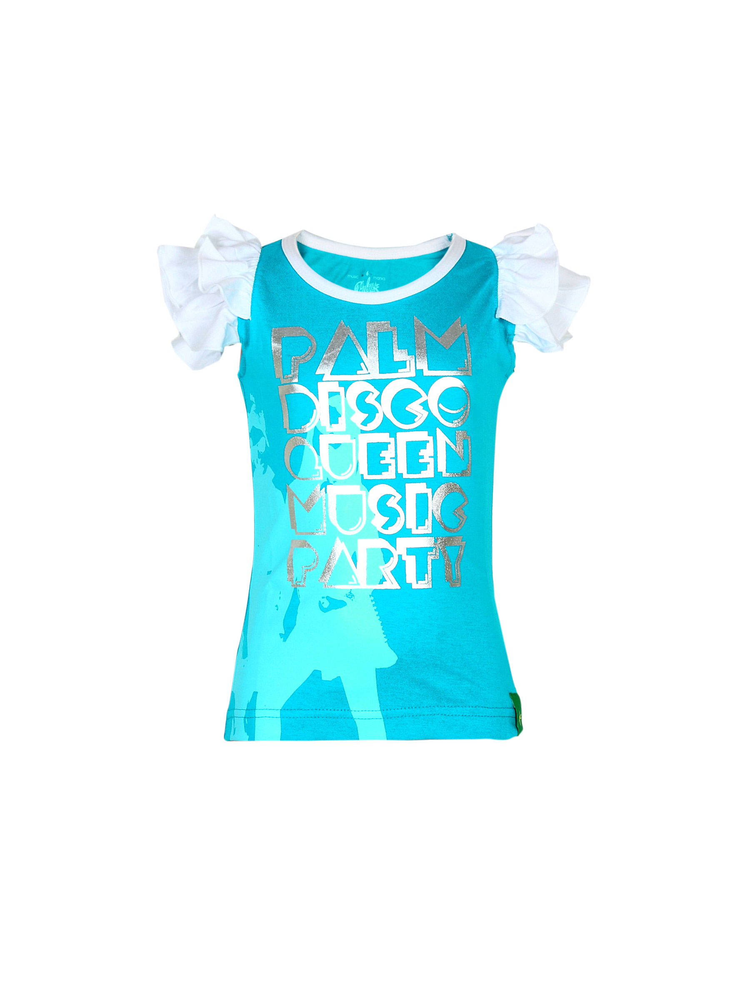

In [572]:
Image.open(fashion_dataset_path / "images" / file_names[0])

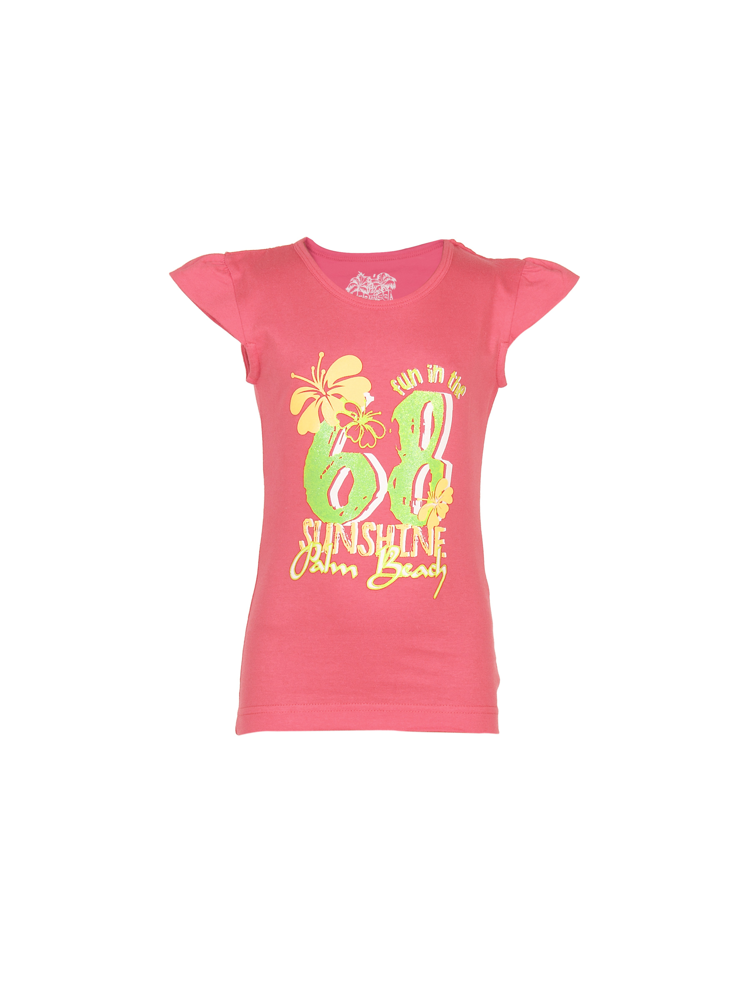

In [573]:
Image.open(fashion_dataset_path / "images" / file_names[1])

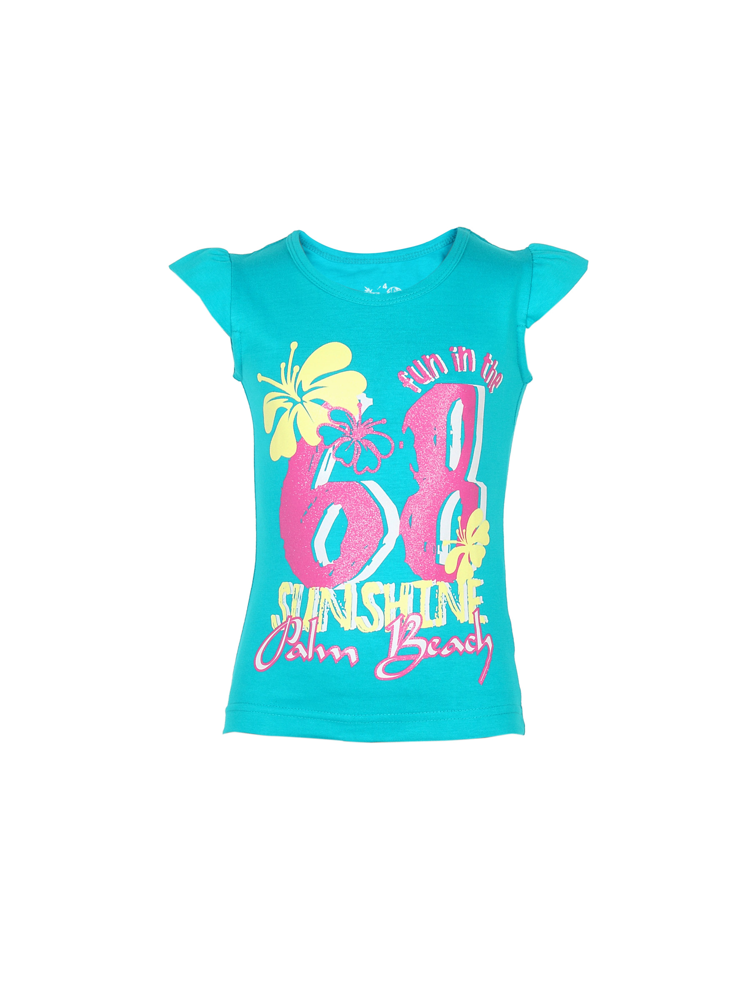

In [574]:
Image.open(fashion_dataset_path / "images" / file_names[2])

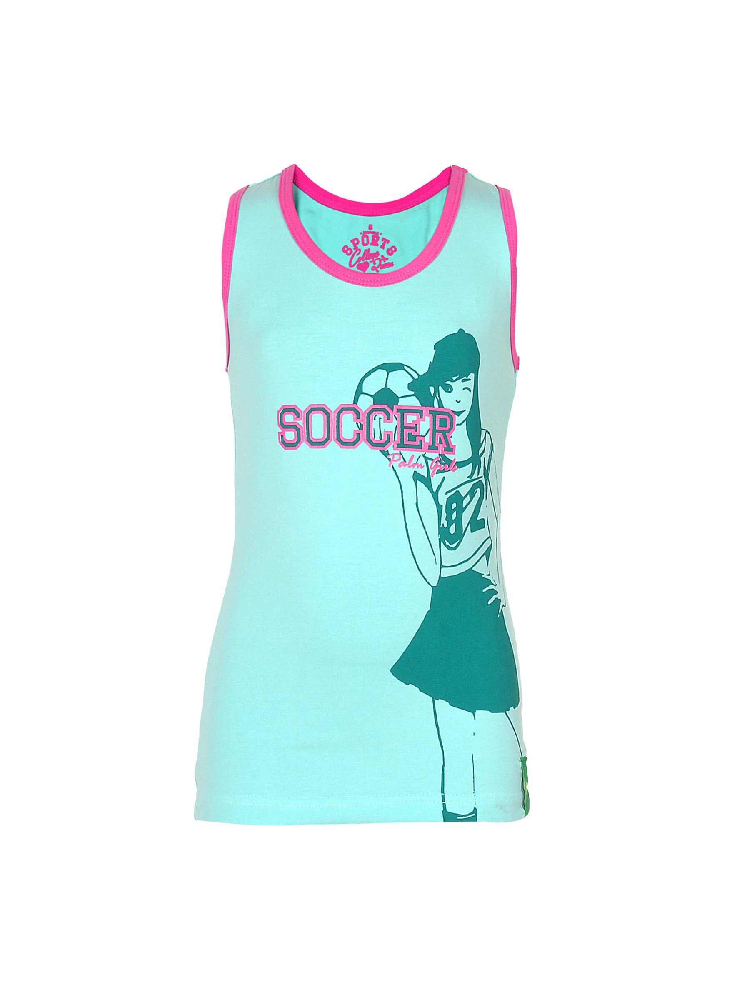

In [575]:
Image.open(fashion_dataset_path / "images" / file_names[3])

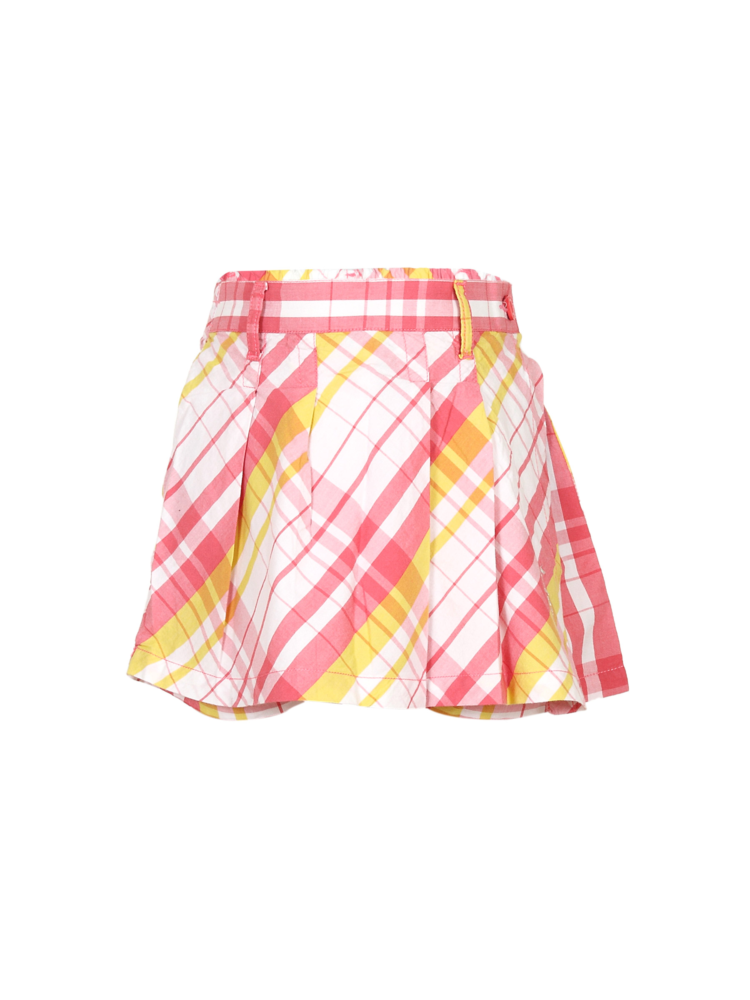

In [576]:
Image.open(fashion_dataset_path / "images" / file_names[4])

In [570]:
trained_model.eval()
with torch.no_grad():
    for file in file_names[:5]:
        img = Image.open(fashion_dataset_path / "images" / file)
        img = transforms(img)
        probs = F.softmax(trained_model(img[None, ...].to(device)))
        print(probs)
        
        idx = probs.argmax().item()
        print(idx2label[idx])

        for i,prob in enumerate(probs[0, :]): print(idx2label[i], prob.item())

/tmp/ipykernel_236/818624211.py:6: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(trained_model(img[None, ...].to(device)))


tensor([[3.9972e-07, 4.8656e-04, 1.9756e-05, 4.2811e-03, 4.0242e-04, 2.1546e-05,
         2.3594e-03, 3.2207e-05, 3.3187e-06, 6.3174e-05, 4.7108e-03, 6.5138e-04,
         3.4270e-06, 4.1701e-02, 2.7873e-02, 9.0810e-01, 2.4467e-03, 6.8437e-03]],
       device='cuda:0')
T-Shirt
Blazer 3.9971700971364044e-07
Blouse 0.0004865627852268517
Body 1.9755714674829505e-05
Dress 0.004281118046492338
Hat 0.00040242241811938584
Hoodie 2.154607864213176e-05
Longsleeve 0.0023594489321112633
Other 3.220653525204398e-05
Outwear 3.3186934160767123e-06
Pants 6.317434599623084e-05
Polo 0.00471084238961339
Shirt 0.0006513830157928169
Shoes 3.427022420510184e-06
Shorts 0.041701141744852066
Skirt 0.02787267416715622
T-Shirt 0.9081001877784729
Top 0.002446671947836876
Undershirt 0.006843650713562965
tensor([[0.0005, 0.0456, 0.0540, 0.1601, 0.0055, 0.0050, 0.0291, 0.0165, 0.0035,
         0.0037, 0.0879, 0.0334, 0.0129, 0.0670, 0.0016, 0.3689, 0.0856, 0.0192]],
       device='cuda:0')
T-Shirt
Blazer 0.000502212

#### Test Set Checking

  0%|          | 0/517 [00:00<?, ?it/s]

/tmp/ipykernel_236/3077643110.py:15: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(trained_model(img[None, ...].to(device)))
/tmp/ipykernel_236/3077643110.py:25: DeprecationWarning: The argument `columns` for `DataFrame.pivot` is deprecated. It has been renamed to `on`.
  error_df = X_test_check[["accurate", "label"]].pivot(index="label",
/tmp/ipykernel_236/3077643110.py:25: DeprecationWarning: `aggregate_function='count'` input for `pivot` is deprecated. Please use `aggregate_function='len'`.
  error_df = X_test_check[["accurate", "label"]].pivot(index="label",


Text(0.5, 1.0, 'Percent Correct')

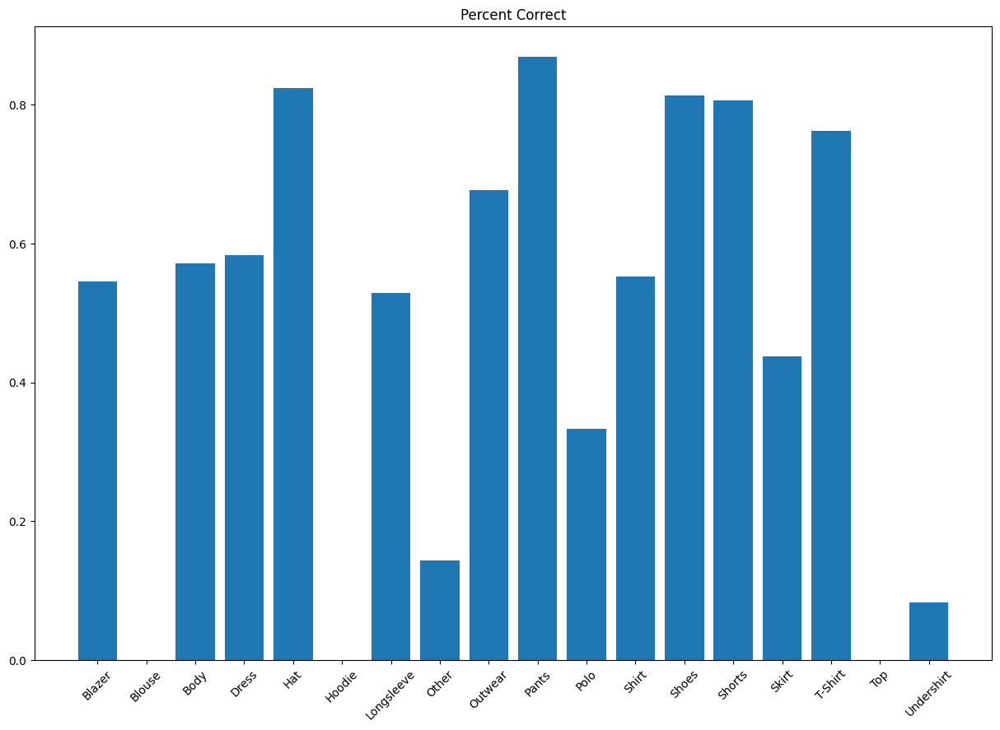

In [577]:
transforms = v2.Compose([
            v2.ToTensor(),
            v2.Resize((224,224)),
            v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

test_labels = []
probs_list = []

trained_model.eval()
with torch.no_grad():
    for img_path in tqdm(X_test["image"].to_list()):
        img = Image.open(f"clothing-dataset/images/{img_path}.jpg")
        img = transforms(img)
        probs = F.softmax(trained_model(img[None, ...].to(device)))
        probs_list.append(probs)
        
        idx = probs.argmax().item()
        test_labels.append(idx2label[idx])
        
X_test_check = X_test.clone()
X_test_check = X_test_check.with_columns(predicted=pl.Series(test_labels))
X_test_check = X_test_check.with_columns(accurate=pl.col("label") == pl.col("predicted"))
X_test_check["accurate"].sum() / X_test_check.shape[0]
error_df = X_test_check[["accurate", "label"]].pivot(index="label",
                                                    columns="accurate",
                                                    values="accurate",
                                                    aggregate_function="count").fill_null(0)
error_df = error_df.with_columns(total=pl.col("true") + pl.col("false"))
error_df = error_df.with_columns(accuracy=pl.col("true") / pl.col("total"))
error_df.sort(by="accuracy", descending=True)
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
plt.bar(error_df.sort(by="label", descending=False)["label"], 
        error_df.sort(by="label", descending=False)["accuracy"])
plt.title("Percent Correct")

In [578]:
error_df.sort(by="accuracy", descending=True)

label,true,false,total,accuracy
str,u32,u32,u32,f64
"""Pants""",60,9,69,0.869565
"""Hat""",14,3,17,0.823529
"""Shoes""",35,8,43,0.813953
"""Shorts""",25,6,31,0.806452
"""T-Shirt""",77,24,101,0.762376
…,…,…,…,…
"""Other""",1,6,7,0.142857
"""Undershirt""",1,11,12,0.083333
"""Hoodie""",0,10,10,0.0


Good enough for government work.

# What are we Missing here: Experimentation and Using MLFlow

So all of this check, do again, check, do again, change code, check, do again, seems to be very manual, repeative, and not great. Really what should be done is make stuff more modular and easy to change an experiment with. Luckily, there are tools for that like ML flow or weights and bias. We'll use that in a next round, but the above model will do us a solid.